<a href="https://colab.research.google.com/github/LittleAri/egg_cards/blob/main/egg_cards_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Egg Cards Clustering

We test out K-means clustering to see if we can group certain types of cards.

We follow the clustering tips in https://towardsdatascience.com/image-clustering-using-k-means-4a78478d2b83

#### Imports

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
from tqdm import tqdm
import os
import shutil
import cv2
import matplotlib.pyplot as plt

#### Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### Feature Extraction Code

In [ ]:
def image_feature(direc,folder_path):
    model = InceptionV3(weights='imagenet', include_top=False)
    features = [];
    img_name = [];
    for i in tqdm(direc):
        fname=folder_path+'/'+i
        img=image.load_img(fname,target_size=(224,224))
        x = img_to_array(img)
        x=np.expand_dims(x,axis=0)
        x=preprocess_input(x)
        feat=model.predict(x)
        feat=feat.flatten()
        features.append(feat)
        img_name.append(i)
    return features,img_name

## Drawer 1 Clusters

Focusing on drawer 1, we test out different values of K for the K-means clustering.

In [ ]:
path_to_images = 'drive/My Drive/egg_cards/drawer_1'
img_path=os.listdir(path_to_images)

In [ ]:
img_features,img_name=image_feature(img_path,path_to_images)

  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 3s 3s/step


  4%|▍         | 1/25 [00:03<01:15,  3.14s/it]

1/1 [==============================] - 0s 279ms/step


  8%|▊         | 2/25 [00:03<00:37,  1.63s/it]

1/1 [==============================] - 0s 250ms/step


 12%|█▏        | 3/25 [00:04<00:26,  1.21s/it]

1/1 [==============================] - 0s 149ms/step


 16%|█▌        | 4/25 [00:04<00:20,  1.05it/s]

1/1 [==============================] - 0s 143ms/step


 20%|██        | 5/25 [00:05<00:15,  1.29it/s]

1/1 [==============================] - 0s 144ms/step


 24%|██▍       | 6/25 [00:05<00:12,  1.53it/s]

1/1 [==============================] - 0s 144ms/step


 28%|██▊       | 7/25 [00:06<00:10,  1.66it/s]

1/1 [==============================] - 0s 151ms/step


 32%|███▏      | 8/25 [00:06<00:09,  1.87it/s]

1/1 [==============================] - 0s 151ms/step


 36%|███▌      | 9/25 [00:07<00:08,  1.95it/s]

1/1 [==============================] - 0s 150ms/step


 40%|████      | 10/25 [00:07<00:07,  1.90it/s]

1/1 [==============================] - 0s 147ms/step


 44%|████▍     | 11/25 [00:08<00:06,  2.04it/s]

1/1 [==============================] - 0s 166ms/step


 48%|████▊     | 12/25 [00:08<00:06,  1.94it/s]

1/1 [==============================] - 0s 170ms/step


 52%|█████▏    | 13/25 [00:09<00:06,  1.84it/s]

1/1 [==============================] - 0s 170ms/step


 56%|█████▌    | 14/25 [00:09<00:06,  1.81it/s]

1/1 [==============================] - 0s 160ms/step


 60%|██████    | 15/25 [00:10<00:05,  1.96it/s]

1/1 [==============================] - 0s 158ms/step


 64%|██████▍   | 16/25 [00:10<00:04,  1.88it/s]

1/1 [==============================] - 0s 142ms/step


 68%|██████▊   | 17/25 [00:11<00:04,  1.94it/s]

1/1 [==============================] - 0s 153ms/step


 72%|███████▏  | 18/25 [00:11<00:03,  1.87it/s]

1/1 [==============================] - 0s 149ms/step


 76%|███████▌  | 19/25 [00:12<00:02,  2.01it/s]

1/1 [==============================] - 0s 150ms/step


 80%|████████  | 20/25 [00:12<00:02,  2.02it/s]

1/1 [==============================] - 0s 152ms/step


 84%|████████▍ | 21/25 [00:13<00:01,  2.08it/s]

1/1 [==============================] - 0s 143ms/step


 88%|████████▊ | 22/25 [00:13<00:01,  1.97it/s]

1/1 [==============================] - 0s 142ms/step


 92%|█████████▏| 23/25 [00:14<00:00,  2.06it/s]

1/1 [==============================] - 0s 311ms/step


 96%|█████████▌| 24/25 [00:15<00:00,  1.78it/s]

1/1 [==============================] - 0s 300ms/step


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


### K=2

In [ ]:
k = 2 # We test with four clusters.
clusters = KMeans(k, random_state = 40)
clusters.fit(img_features)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=2, random_state=40)

In [ ]:
image_cluster = pd.DataFrame(img_name,columns=['image'])
image_cluster["clusterid"] = clusters.labels_

In [ ]:
colours = {0:'r',1:'g'}

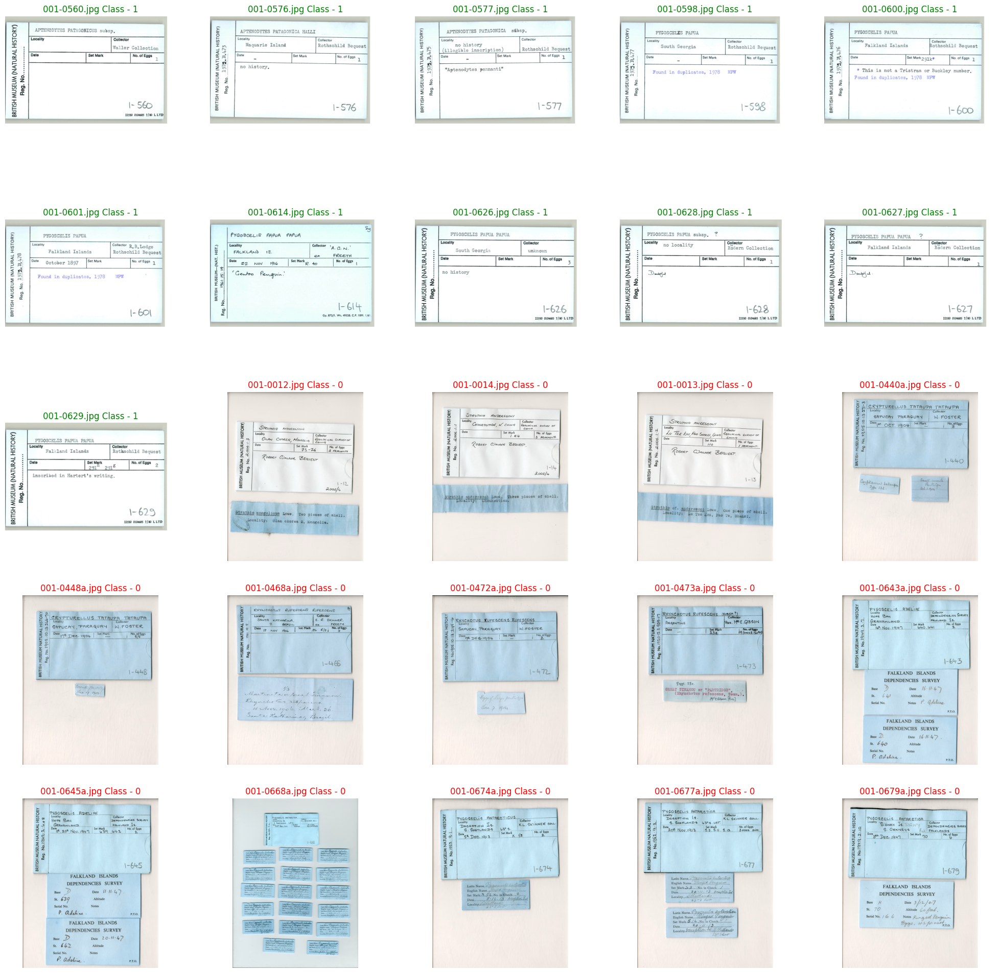

In [ ]:
fig,ax = plt.subplots(5,5,figsize=(25,25))
k = 0
for i in range(25):
  j = int(i%5)
  if (i>0) and (j==0):
    k = k+1
  name,cluster_id = image_cluster.iloc[i]
  img = cv2.imread(path_to_images+'/'+name)
  col = colours[int(cluster_id)]
  ax[k,j].imshow(img)
  ax[k,j].set_title(name+' Class - '+str(cluster_id),color=col)
  ax[k,j].axis('off')

### K=4

In [ ]:
k = 4 # We test with four clusters.
clusters = KMeans(k, random_state = 40)
clusters.fit(img_features)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=4, random_state=40)

In [ ]:
image_cluster = pd.DataFrame(img_name,columns=['image'])
image_cluster["clusterid"] = clusters.labels_

In [ ]:
colours = {0:'r',1:'g',2:'b',3:'k'}

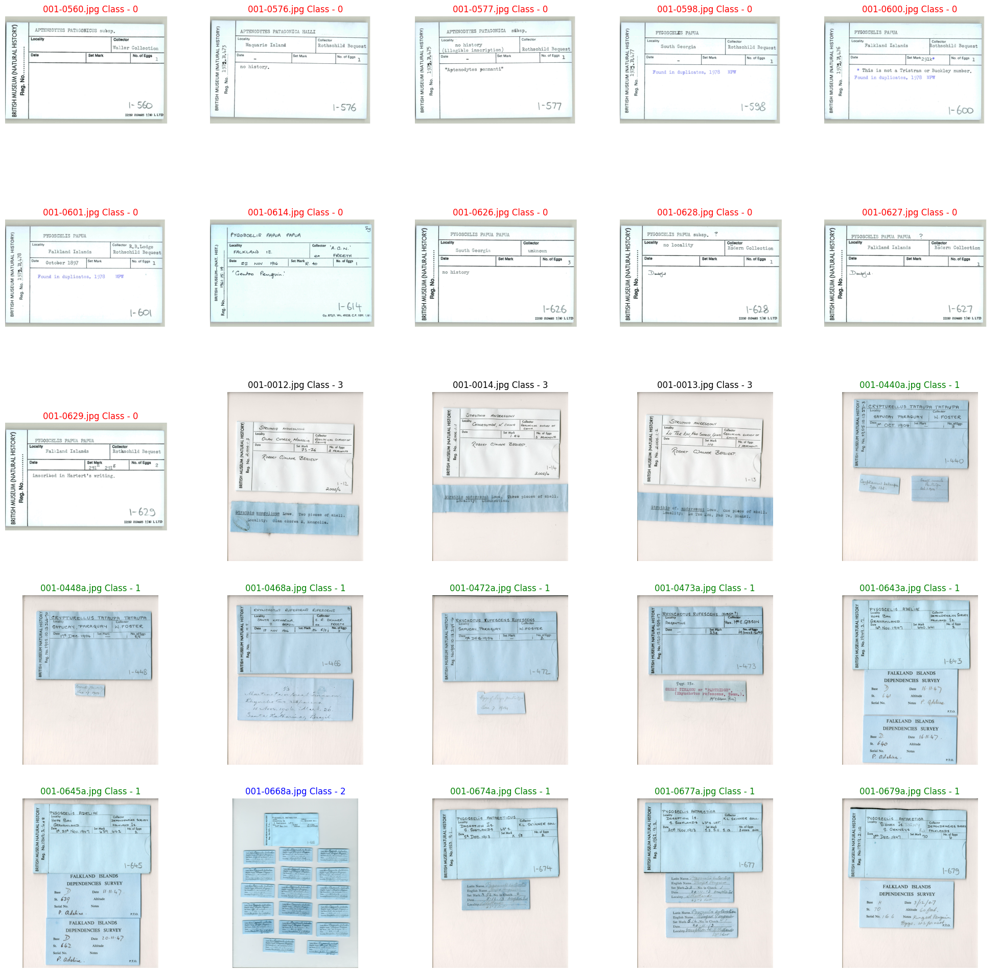

In [ ]:
fig,ax = plt.subplots(5,5,figsize=(25,25))
k = 0
for i in range(25):
  j = int(i%5)
  if (i>0) and (j==0):
    k = k+1
  name,cluster_id = image_cluster.iloc[i]
  img = cv2.imread(path_to_images+'/'+name)
  col = colours[int(cluster_id)]
  ax[k,j].imshow(img)
  ax[k,j].set_title(name+' Class - '+str(cluster_id),color=col)
  ax[k,j].axis('off')

### K=5

In [ ]:
k = 5 # We test with four clusters.
clusters = KMeans(k, random_state = 40)
clusters.fit(img_features)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=5, random_state=40)

In [ ]:
image_cluster = pd.DataFrame(img_name,columns=['image'])
image_cluster["clusterid"] = clusters.labels_

In [ ]:
colours = {0:'r',1:'g',2:'b',3:'k',4:'y'}

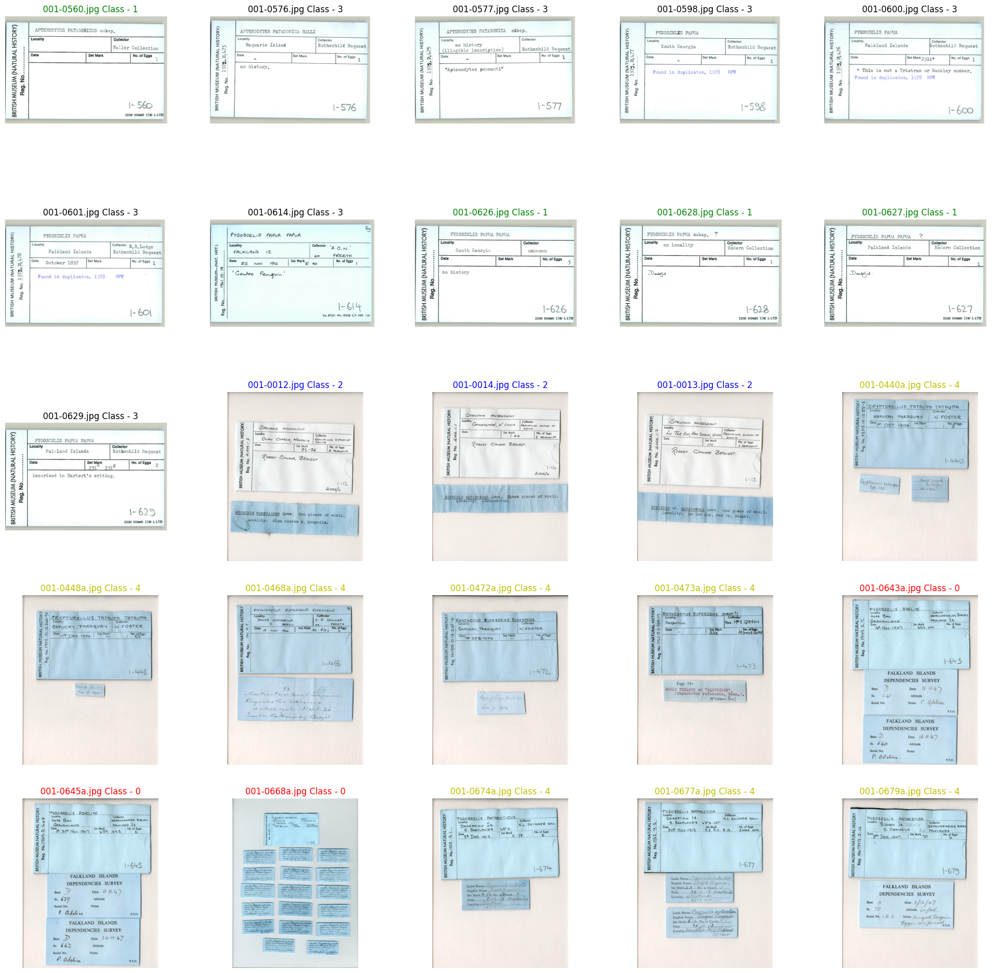

In [ ]:
fig,ax = plt.subplots(5,5,figsize=(25,25))
k = 0
for i in range(25):
  j = int(i%5)
  if (i>0) and (j==0):
    k = k+1
  name,cluster_id = image_cluster.iloc[i]
  img = cv2.imread(path_to_images+'/'+name)
  col = colours[int(cluster_id)]
  ax[k,j].imshow(img)
  ax[k,j].set_title(name+' Class - '+str(cluster_id),color=col)
  ax[k,j].axis('off')

## Drawer 2 Cluster

(K=2, K-means clustering.)

In [ ]:
path_to_images = 'drive/My Drive/egg_cards/drawer_2'
img_path=os.listdir(path_to_images)

In [ ]:
img_features,img_name=image_feature(img_path,path_to_images)

  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


  4%|▍         | 1/25 [00:01<00:46,  1.94s/it]

1/1 [==============================] - 0s 171ms/step


  8%|▊         | 2/25 [00:02<00:26,  1.16s/it]

1/1 [==============================] - 0s 155ms/step


 12%|█▏        | 3/25 [00:03<00:19,  1.12it/s]

1/1 [==============================] - 0s 178ms/step


 16%|█▌        | 4/25 [00:03<00:16,  1.28it/s]

1/1 [==============================] - 0s 285ms/step


 20%|██        | 5/25 [00:04<00:16,  1.23it/s]

1/1 [==============================] - 0s 260ms/step


 24%|██▍       | 6/25 [00:05<00:14,  1.29it/s]

1/1 [==============================] - 0s 267ms/step


 28%|██▊       | 7/25 [00:06<00:14,  1.24it/s]

1/1 [==============================] - 0s 287ms/step


 32%|███▏      | 8/25 [00:06<00:13,  1.24it/s]

1/1 [==============================] - 0s 268ms/step


 36%|███▌      | 9/25 [00:07<00:12,  1.25it/s]

1/1 [==============================] - 0s 148ms/step


 40%|████      | 10/25 [00:08<00:10,  1.36it/s]

1/1 [==============================] - 0s 154ms/step


 44%|████▍     | 11/25 [00:09<00:09,  1.40it/s]

1/1 [==============================] - 0s 143ms/step


 48%|████▊     | 12/25 [00:09<00:09,  1.39it/s]

1/1 [==============================] - 0s 148ms/step


 52%|█████▏    | 13/25 [00:10<00:08,  1.48it/s]

1/1 [==============================] - 0s 148ms/step


 56%|█████▌    | 14/25 [00:11<00:07,  1.46it/s]

1/1 [==============================] - 0s 150ms/step


 60%|██████    | 15/25 [00:11<00:06,  1.57it/s]

1/1 [==============================] - 0s 159ms/step


 64%|██████▍   | 16/25 [00:12<00:05,  1.71it/s]

1/1 [==============================] - 0s 153ms/step


 68%|██████▊   | 17/25 [00:12<00:04,  1.73it/s]

1/1 [==============================] - 0s 144ms/step


 72%|███████▏  | 18/25 [00:13<00:04,  1.71it/s]

1/1 [==============================] - 0s 156ms/step


 76%|███████▌  | 19/25 [00:13<00:03,  1.77it/s]

1/1 [==============================] - 0s 149ms/step


 80%|████████  | 20/25 [00:14<00:02,  1.84it/s]

1/1 [==============================] - 0s 142ms/step


 84%|████████▍ | 21/25 [00:14<00:02,  1.87it/s]

1/1 [==============================] - 0s 143ms/step


 88%|████████▊ | 22/25 [00:15<00:01,  1.99it/s]

1/1 [==============================] - 0s 157ms/step


 92%|█████████▏| 23/25 [00:15<00:00,  2.11it/s]

1/1 [==============================] - 0s 162ms/step


 96%|█████████▌| 24/25 [00:16<00:00,  2.01it/s]

1/1 [==============================] - 0s 150ms/step


100%|██████████| 25/25 [00:16<00:00,  1.50it/s]


In [ ]:
k = 2 # We test with four clusters.
clusters = KMeans(k, random_state = 40)
clusters.fit(img_features)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=2, random_state=40)

In [ ]:
image_cluster = pd.DataFrame(img_name,columns=['image'])
image_cluster["clusterid"] = clusters.labels_

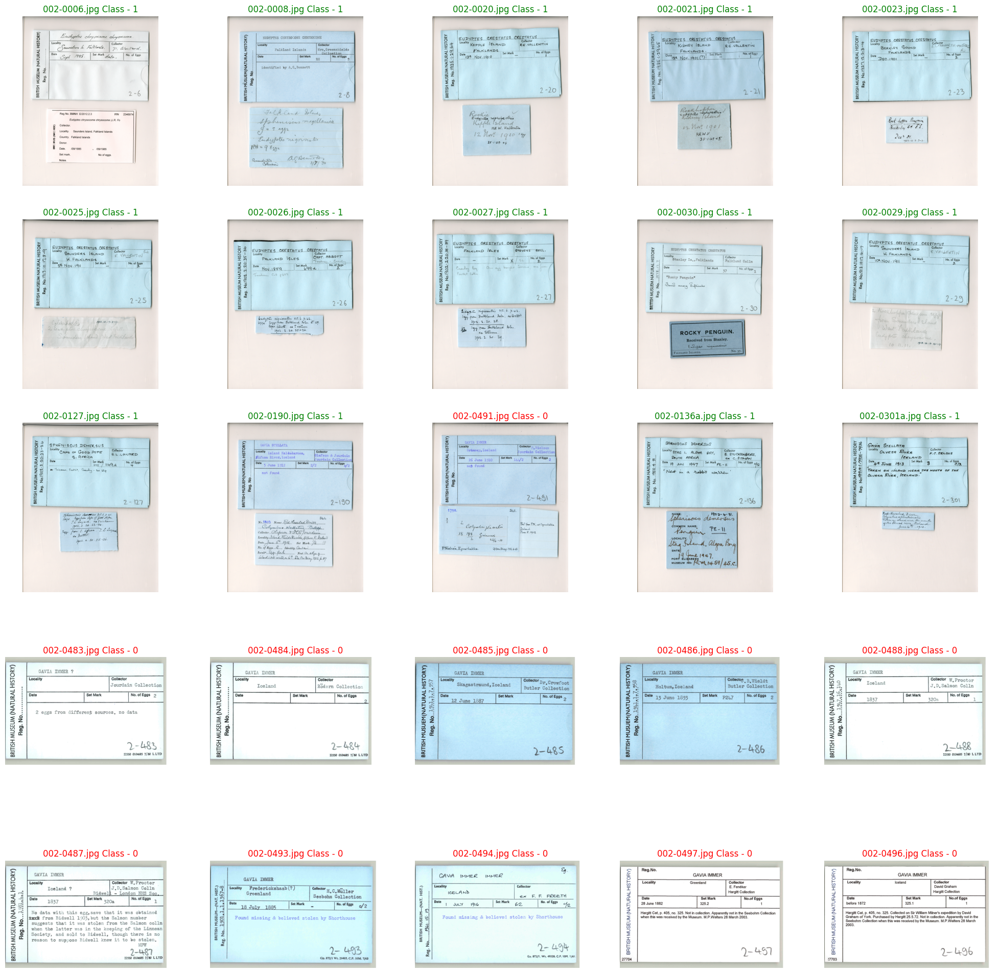

In [ ]:
fig,ax = plt.subplots(5,5,figsize=(25,25))
k = 0
for i in range(25):
  j = int(i%5)
  if (i>0) and (j==0):
    k = k+1
  name,cluster_id = image_cluster.iloc[i]
  img = cv2.imread(path_to_images+'/'+name)
  col = colours[int(cluster_id)]
  ax[k,j].imshow(img)
  ax[k,j].set_title(name+' Class - '+str(cluster_id),color=col)
  ax[k,j].axis('off')

## Drawer 58
(K=2, K-means clustering.)

In [ ]:
path_to_images = 'drive/My Drive/egg_cards/drawer_58'
img_path=os.listdir(path_to_images)

In [ ]:
img_features,img_name=image_feature(img_path,path_to_images)

  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 3s 3s/step


  4%|▍         | 1/25 [00:03<01:27,  3.64s/it]

1/1 [==============================] - 0s 312ms/step


  8%|▊         | 2/25 [00:04<00:45,  1.97s/it]

1/1 [==============================] - 0s 360ms/step


 12%|█▏        | 3/25 [00:05<00:29,  1.36s/it]

1/1 [==============================] - 0s 313ms/step


 16%|█▌        | 4/25 [00:05<00:22,  1.06s/it]

1/1 [==============================] - 0s 391ms/step


 20%|██        | 5/25 [00:06<00:20,  1.02s/it]

1/1 [==============================] - 0s 345ms/step


 24%|██▍       | 6/25 [00:07<00:16,  1.17it/s]

1/1 [==============================] - 0s 281ms/step


 28%|██▊       | 7/25 [00:07<00:13,  1.37it/s]

1/1 [==============================] - 0s 239ms/step


 32%|███▏      | 8/25 [00:08<00:11,  1.47it/s]

1/1 [==============================] - 0s 358ms/step


 36%|███▌      | 9/25 [00:08<00:10,  1.52it/s]

1/1 [==============================] - 0s 349ms/step


 40%|████      | 10/25 [00:09<00:09,  1.50it/s]

1/1 [==============================] - 0s 472ms/step


 44%|████▍     | 11/25 [00:10<00:11,  1.25it/s]

1/1 [==============================] - 1s 554ms/step


 48%|████▊     | 12/25 [00:11<00:11,  1.14it/s]

1/1 [==============================] - 1s 519ms/step


 52%|█████▏    | 13/25 [00:12<00:10,  1.09it/s]

1/1 [==============================] - 1s 506ms/step


 56%|█████▌    | 14/25 [00:13<00:10,  1.05it/s]

1/1 [==============================] - 0s 286ms/step


 60%|██████    | 15/25 [00:14<00:08,  1.23it/s]

1/1 [==============================] - 0s 149ms/step


 64%|██████▍   | 16/25 [00:14<00:05,  1.52it/s]

1/1 [==============================] - 0s 149ms/step


 68%|██████▊   | 17/25 [00:14<00:04,  1.83it/s]

1/1 [==============================] - 0s 162ms/step


 72%|███████▏  | 18/25 [00:15<00:03,  1.92it/s]

1/1 [==============================] - 0s 144ms/step


 76%|███████▌  | 19/25 [00:15<00:02,  2.20it/s]

1/1 [==============================] - 0s 144ms/step


 80%|████████  | 20/25 [00:15<00:01,  2.51it/s]

1/1 [==============================] - 0s 159ms/step


 84%|████████▍ | 21/25 [00:16<00:01,  2.77it/s]

1/1 [==============================] - 0s 142ms/step


 88%|████████▊ | 22/25 [00:16<00:01,  2.97it/s]

1/1 [==============================] - 0s 145ms/step


 92%|█████████▏| 23/25 [00:16<00:00,  3.16it/s]

1/1 [==============================] - 0s 160ms/step


 96%|█████████▌| 24/25 [00:16<00:00,  3.24it/s]

1/1 [==============================] - 0s 150ms/step


100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


In [ ]:
k = 2 # We test with four clusters.
clusters = KMeans(k, random_state = 40)
clusters.fit(img_features)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=2, random_state=40)

In [ ]:
image_cluster = pd.DataFrame(img_name,columns=['image'])
image_cluster["clusterid"] = clusters.labels_

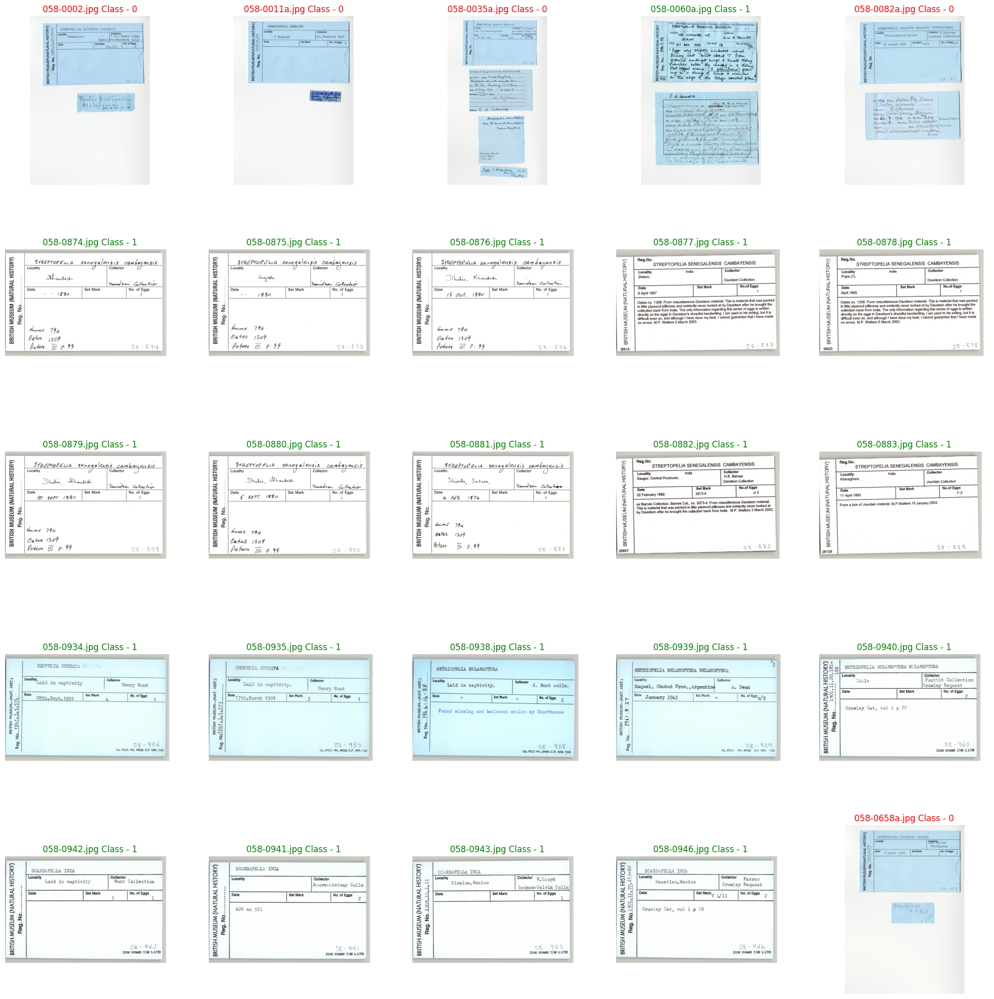

In [ ]:
fig,ax = plt.subplots(5,5,figsize=(25,25))
k = 0
for i in range(25):
  j = int(i%5)
  if (i>0) and (j==0):
    k = k+1
  name,cluster_id = image_cluster.iloc[i]
  img = cv2.imread(path_to_images+'/'+name)
  col = colours[int(cluster_id)]
  ax[k,j].imshow(img)
  ax[k,j].set_title(name+' Class - '+str(cluster_id),color=col)
  ax[k,j].axis('off')